In [1]:
import numpy as np
import xarray as xr
import pygmt

from pathlib import Path

from fdr_test import fdr_test

In [2]:
def colourbar_scale(da):
    abs_max = np.abs(da).max()
    return int(np.around(abs_max, -2) * 1.2)

In [2]:
def colourbar_scale_mca(da):
    abs_max = np.abs(da).max()
    return float(np.around(abs_max, 3) * 1.2)

In [47]:
scale

121272

In [8]:
path = Path("C:\\Users\\User\\Documents\\msc-research\\papers\\paper1\\figures\\data\\cov\\")
mean_fname = "mean_sam_pearson_cov.nc"
var_fname = "variance_sam_pearson_cov.nc"
var_corr_fname = "variance_sam_pearson_corr.nc"

ds_mean = xr.open_dataset(path / mean_fname)
ds_var = xr.open_dataset(path / var_fname) 
ds_var_corr = xr.open_dataset(path / var_corr_fname)
ds_fdr = fdr_test(ds_var_corr)

significant = ds_fdr.significant.astype('float64').to_dataframe().reset_index()
scale = colourbar_scale(ds_var['cov'])

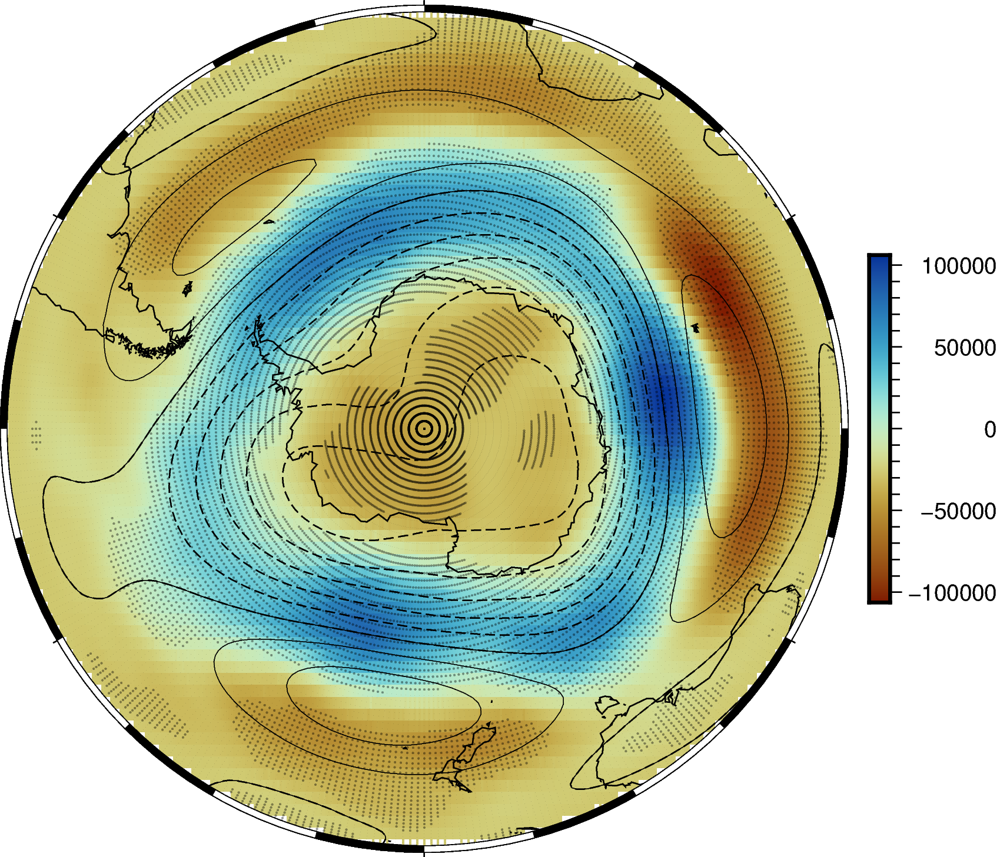

In [11]:
fig = pygmt.Figure()
pygmt.config(MAP_FRAME_TYPE="fancy+")
fig.basemap(region="g", projection="G0/-90/70/12c", frame="a")

ds_var['cov'] *= -1.0
ds_mean['cov'] *= -1.0

fig.grdimage(
    grid=ds_var['cov'],
    cmap="roma",
    projection="G0/-90/70/12c",
    frame=('f'),
)
fig.grdcontour(
    grid=ds_mean['cov'],
    limit=[-scale * 1.2, 0],
    pen="0.5p,black,-",
    interval=100,
    #annotation='10'
)
fig.grdcontour(
    grid=ds_mean['cov'],
    limit=[0, scale * 1.2],
    interval=100,
    #annotation='10'
)
fig.plot(
    x=significant.lon,
    y=significant.lat,
    size=0.03 * (significant.significant),
    style="cc",
    color="black",
    transparency=60
)

fig.colorbar(
    cmap="roma",
    position="JMR+o0.4c/0c+w5c/0.3c",
    frame=["x+l "],
    scale=scale,
    )
fig.coast(shorelines="1/0.5p", resolution="c")

fig.show()

In [6]:
def open_cov_datasets(season=None):
    path = Path("C:\\Users\\User\\Documents\\msc-research\\papers\\paper1\\figures\\data\\cov\\")

    if season == None:
        mean_fname = "mean_sam_rank_cov.nc"
        var_fname = "variance_sam_rank_cov.nc"
        var_corr_fname = "variance_sam_rank_corr.nc"
    else:
        mean_fname = f"{season}_mean_sam_pearson_cov.nc"
        var_fname = f"{season}_variance_sam_pearson_cov.nc"
        var_corr_fname = f"{season}_variance_sam_pearson_corr.nc"

    ds_mean = xr.open_dataset(path / mean_fname)
    ds_var = xr.open_dataset(path / var_fname) 
    ds_var_corr = xr.open_dataset(path / var_corr_fname)
    ds_fdr = fdr_test(ds_var_corr)

    significant = ds_fdr.significant.astype('float64').to_dataframe().reset_index()
    scale = colourbar_scale(ds_var['cov'])

    return ds_mean, ds_var, significant, scale

In [14]:
def cov_figure(fig, season=None):
    ds_mean, ds_var, significant, scale = open_cov_datasets(season)

    ds_var['cov'] *= -1.0
    ds_mean['cov'] *= -1.0

    fig.grdimage(
        grid=ds_var['cov'],
        cmap="roma",
        projection="G0/-90/70/12c",
        frame=('a'),
    )
    fig.grdcontour(
        grid=ds_mean['cov'],
        limit=[-scale * 1.2, 0],
        pen="0.5p,black,-",
        interval=100,
        #annotation='10'
    )
    fig.grdcontour(
        grid=ds_mean['cov'],
        limit=[0, scale * 1.2],
        interval=100,
        #annotation='10'
    )
    fig.plot(
        x=significant.lon,
        y=significant.lat,
        size=0.03 * (significant.significant),
        style="cc",
        color="black",
        transparency=20
    )

    fig.coast(shorelines="1/0.5p", resolution="c")

    return scale

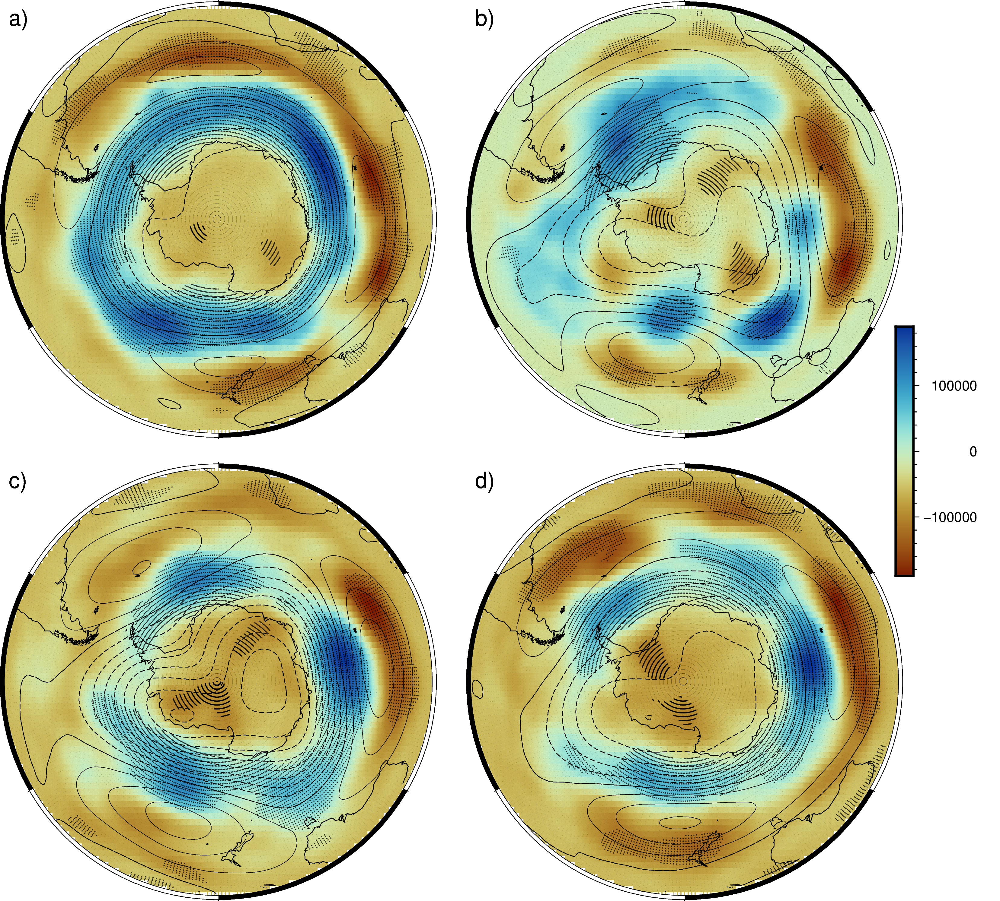

In [15]:
# Create figures for seasonal covariance maps.
seasons = ['DJF', 'MAM', 'JJA', 'SON']
index = 0
scale = 0
fig = pygmt.Figure()
with fig.subplot(
    nrows=2,
    ncols=2,
    figsize=("25c", "25c"),  # width of 15 cm, height of 6 cm
    autolabel=True,
    margins=["0.3c", "0.2c"],  # horizontal 0.3 cm and vertical 0.2 cm margin
    frame="a",
):
    fig.basemap(region="g", projection="G0/-90/70/12c", frame="a", panel=True)
    fig.basemap(region="g", projection="G0/-90/70/12c", frame="a", panel=True)
    fig.basemap(region="g", projection="G0/-90/70/12c", frame="a", panel=True)
    fig.basemap(region="g", projection="G0/-90/70/12c", frame="a", panel=True)

    for season in seasons:
        with fig.set_panel(panel=index):
            tmp_scale = cov_figure(fig, season)
            if tmp_scale > scale:
                scale = tmp_scale
            
        index += 1
    
    fig.colorbar(
        cmap="roma",
        position="JTR+o0c/-3c+w7c/0.5c",
        frame=["x+l "],
        scale=scale,
        )

fig.show()

In [79]:
def open_comp_datasets(season):
    path = Path("C:\\Users\\User\\Documents\\msc-research\\papers\\paper1\\figures\\data\\composites\\")

    upper_mean_fname = f"{season}_mean_SOI_upper_composite.nc"
    lower_mean_fname = f"{season}_mean_SOI_lower_composite.nc"
    upper_var_fname = f"{season}_variance_SOI_upper_composite.nc"
    lower_var_fname = f"{season}_variance_SOI_lower_composite.nc"

    ds_upper_mean = xr.open_dataset(path / upper_mean_fname)
    ds_lower_mean = xr.open_dataset(path / lower_mean_fname)
    ds_upper_var = xr.open_dataset(path / upper_var_fname) 
    ds_lower_var = xr.open_dataset(path / lower_var_fname)
    
    scale = colourbar_scale(ds_upper_var['z'])

    return ds_upper_mean, ds_lower_mean, ds_upper_var, ds_lower_var, scale

In [81]:
def composites(fig, ds_mean, ds_var):

    fig.grdimage(
        grid=ds_var['z'],
        cmap="roma",
        projection="G0/-90/70/12c",
        frame=(f'x+l{season}'),
    )
    fig.grdcontour(
        grid=ds_mean['z'],
        limit=[-scale * 1.2, 0],
        pen="0.5p,black,-",
        interval=200,
        #annotation='10'
    )
    fig.grdcontour(
        grid=ds_mean['z'],
        limit=[0, scale * 1.2],
        interval=200,
        #annotation='10'
    )

    fig.coast(shorelines="1/0.5p", resolution="c")

    return scale

In [ ]:
# Create figures for composite maps.
index = 0
scale = 0
fig = pygmt.Figure()

ds_upper_mean_DJF, ds_lower_mean_DJF, ds_upper_var_DJF, ds_lower_var_DJF, scale = open_comp_datasets("DJF")
ds_upper_mean_MAM, ds_lower_mean_MAM, ds_upper_var_MAM, ds_lower_var_MAM, scale = open_comp_datasets("MAM")

comps = [
    (ds_upper_mean_DJF, ds_upper_var_DJF), (ds_lower_mean_DJF, ds_lower_var_DJF),
    (ds_upper_mean_MAM, ds_upper_var_MAM), (ds_lower_mean_MAM, ds_lower_var_MAM),
]

with fig.subplot(
    nrows=2,
    ncols=2,
    figsize=("25c", "25c"),
    autolabel=True,
    margins=["0.3c", "0.2c"],  # horizontal 0.3 cm and vertical 0.2 cm margin
    frame="a",
):
    fig.basemap(region="g", projection="G0/-90/70/12c", frame="a", panel=True)
    fig.basemap(region="g", projection="G0/-90/70/12c", frame="a", panel=True)
    fig.basemap(region="g", projection="G0/-90/70/12c", frame="a", panel=True)
    fig.basemap(region="g", projection="G0/-90/70/12c", frame="a", panel=True)

    for comp in comps:
        with fig.set_panel(panel=index):
            composites(fig, comp[0], comp[1])
        index += 1
    
    fig.colorbar(
        cmap="roma",
        position="JMR+o1c/0c+w7c/0.5c",
        frame=["x+l "],
        scale=scale,
    )

fig.show()

In [23]:
def open_mca_datasets(season, mode=1, timescale="daily"):
    path = Path("C:\\Users\\User\\Documents\\msc-research\\papers\\paper1\\figures\\data\\mca\\")

    if timescale == "daily":
        path = path / "daily"
        fname = f"mca_15_day_window_{season}_mode{mode}.nc"
    else:
        path = path / "monthly"
        fname = f"mca_monthly_{season}_mode{mode}.nc"
    

    ds = xr.open_dataset(path / fname)
    var_da = ds['var']
    mean_da = ds['mean']
    scale = colourbar_scale_mca(var_da)

    return mean_da, var_da, scale

In [11]:
def mca_figures(fig, mean_da, var_da, scale):

    fig.grdimage(
        grid=var_da,
        cmap="roma",
        #projection="G0/-90/70/12c",
        frame=('f'),
        nan_transparent=True,
        interpolation='b'
    )
    fig.grdcontour(
        grid=mean_da,
        limit=[-scale * 1.2, 0],
        pen="1.5p,black,-",
        interval=0.005,
        #annotation='10'
    )
    fig.grdcontour(
        grid=mean_da,
        limit=[0, scale * 1.2],
        pen="1.5p,black,solid",
        interval=0.005,
        #annotation='10'
    )

    fig.coast(shorelines="1/0.5p", resolution="c")

In [ ]:
# Create figures for SOI MCA modes.
modes = [("JJA", 1), ("JJA", 5), ("DJF", 4), ("MAM", 3)] # monthly
#modes = [("JJA", 2), ("MAM", 5), ("SON", 2), ("SON", 4)] # daily
index = 0
scale = 0
fig = pygmt.Figure()
with fig.subplot(
    nrows=2,
    ncols=2,
    figsize=("25c", "25c"),
    autolabel=True,
    margins=["0.3c", "0.2c"],  # horizontal 0.3 cm and vertical 0.2 cm margin
    frame="a",
):
    fig.basemap(region="g", projection="G0/-90/70/12c", frame="a", panel=True)
    fig.basemap(region="g", projection="G0/-90/70/12c", frame="a", panel=True)
    fig.basemap(region="g", projection="G0/-90/70/12c", frame="a", panel=True)
    fig.basemap(region="g", projection="G0/-90/70/12c", frame="a", panel=True)

    for mode in modes:
        with fig.set_panel(panel=index):
            mean_da, var_da, scale = open_mca_datasets(mode[0], mode[1], "monthly")
            mca_figures(fig, mean_da, var_da, scale)
            if tmp_scale > scale:
                scale = tmp_scale
        index += 1

fig.show()

In [ ]:
# Individual MCA mode plots.
mode = 3
season = "JJA"
timescale = "monthly"
index = 0
scale = 0

fig = pygmt.Figure()
fig.basemap(region="g", projection="G0/-90/70/12c", frame="a")

mean_da, var_da, scale = open_mca_datasets(season, mode, timescale)
mca_figures(fig, mean_da, var_da, scale)

fig.show()


In [12]:
ds = xr.open_dataset("C:\\Users\\User\\Documents\\msc-research\\papers\\nzmetconf\\figures\\data\\ACCESS-CM2_mode1.nc")

In [ ]:
fig = pygmt.Figure()
fig.basemap(region="g", projection="G0/-90/70/12c", frame="a")
var_da = ds['var'].where((ds['var'] > 0.004) + (ds['var'] < -0.004))
mean_da = ds['mean']
scale = colourbar_scale_mca(var_da)
mca_figures(fig, mean_da, var_da, scale)
fig.show()

In [16]:
for index in range(6):
    i = index // 3
    j = index % 3
    print(i, j)

0 0
0 1
0 2
1 0
1 1
1 2


In [ ]:
# Create figure for NZMetSoc Conference.
path = Path("C:\\Users\\User\\Documents\\msc-research\\papers\\nzmetconf\\figures\\data\\")
files = list(path.glob("*.nc"))
datasets = ["ERA5", "ACCESS-CM2", "CESM2", "EC-Earth3", "NorESM2-MM"]
index = 0
scale = 0
fig = pygmt.Figure()

for dataset in datasets:
    with fig.subplot(
        nrows=5,
        ncols=3,
        figsize=("75c", "125c"),
        autolabel=True,
        margins=["0.3c", "0.2c"],  # horizontal 0.3 cm and vertical 0.2 cm margin
    ):
        for file in files:
            if dataset in str(file):
                print(index, file)
                i = index // 3
                j = index % 3
                fig.basemap(region="g", projection="G0/-90/70/24c", frame=("f"), panel=[i, j])
                
                ds = xr.open_dataset(path / file)
                var_da = ds['var'].where((ds['var'] > 0.004) + (ds['var'] < -0.004))
                mean_da = ds['mean']
                scale = colourbar_scale_mca(var_da)

                if i == 0 and j == 0:
                    var_da *= -1.0
                    mean_da *= -1.0
                elif i == 3 and j == 0:
                    var_da *= -1.0
                    mean_da *= -1.0
                elif i == 1 and j == 1:
                    var_da *= -1.0
                    mean_da *= -1.0

                with fig.set_panel(panel=[i, j]):
                    mca_figures(fig, mean_da, var_da, scale)
                index += 1

fig.show()

In [21]:
# Create figure for NZMetSoc Conference.
path = Path("C:\\Users\\User\\Documents\\msc-research\\papers\\paper1\\figures\\data\\mca\\sub-monthly\\")
files = list(path.glob("*.nc"))
datasets = ["annual", "DJF", "MAM", "JJA", "SON"]
index = 0
scale = 0
fig = pygmt.Figure()

for dataset in datasets:
    with fig.subplot(
        nrows=5,
        ncols=3,
        figsize=("75c", "125c"),
        autolabel=True,
        margins=["0.3c", "0.2c"],  # horizontal 0.3 cm and vertical 0.2 cm margin
    ):
        for file in files:
            if dataset in str(file):
                print(index, file)
                i = index // 3
                j = index % 3
                fig.basemap(region="g", projection="G0/-90/70/24c", frame=("f"), panel=[i, j])
                
                ds = xr.open_dataset(path / file)
                var_da = ds['var']#.where((ds['var'] > 0.004) + (ds['var'] < -0.004))
                mean_da = ds['mean']
                scale = colourbar_scale_mca(var_da)

                if (i == 0 and j == 0) or (i == 1 and j == 0)\
                    or (i == 3 and j == 1) or (i == 4 and j == 1):
                    var_da *= -1.0
                    mean_da *= -1.0

                with fig.set_panel(panel=[i, j]):
                    mca_figures(fig, mean_da, var_da, scale)
                index += 1

fig.show()

0 C:\Users\User\Documents\msc-research\papers\paper1\figures\data\mca\sub-monthly\annual_mode1.nc
1 C:\Users\User\Documents\msc-research\papers\paper1\figures\data\mca\sub-monthly\annual_mode2.nc
2 C:\Users\User\Documents\msc-research\papers\paper1\figures\data\mca\sub-monthly\annual_mode3.nc
3 C:\Users\User\Documents\msc-research\papers\paper1\figures\data\mca\sub-monthly\DJF_mode1.nc
4 C:\Users\User\Documents\msc-research\papers\paper1\figures\data\mca\sub-monthly\DJF_mode2.nc
5 C:\Users\User\Documents\msc-research\papers\paper1\figures\data\mca\sub-monthly\DJF_mode3.nc
6 C:\Users\User\Documents\msc-research\papers\paper1\figures\data\mca\sub-monthly\MAM_mode1.nc
7 C:\Users\User\Documents\msc-research\papers\paper1\figures\data\mca\sub-monthly\MAM_mode2.nc
8 C:\Users\User\Documents\msc-research\papers\paper1\figures\data\mca\sub-monthly\MAM_mode3.nc
9 C:\Users\User\Documents\msc-research\papers\paper1\figures\data\mca\sub-monthly\JJA_mode1.nc
10 C:\Users\User\Documents\msc-research\p